### Final annotation of B cells


Preprocessing:
- B cells from main object subsetted
- performed scvi batch correction to prepare objects with cell cycle gene regression and variable Ig genes regressed

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [5]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/post_scvi20221124/B.hvg5000_noCC_noIgVar.scvi_output.with_annotv2_v3.22021124.h5ad')

In [6]:
adata

AnnData object with n_obs × n_vars = 179332 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

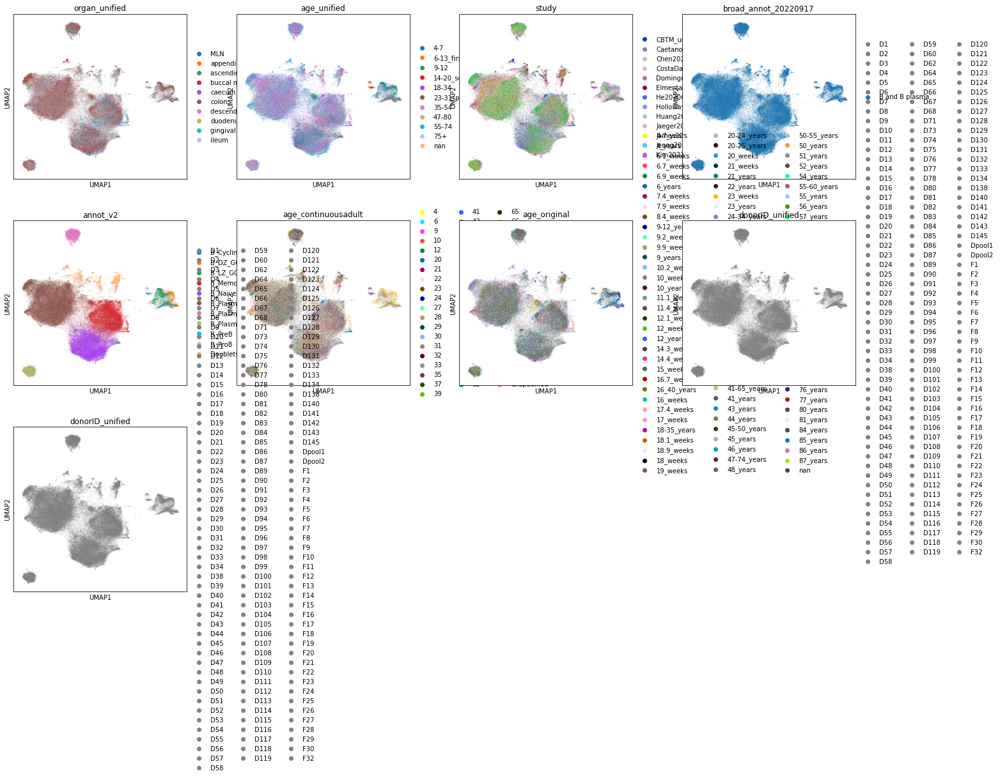

In [7]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata, color=['organ_unified', 'age_unified','study','broad_annot_20220917','annot_v2','age_continuousadult','age_original','donorID_unified','donorID_unified'],cmap='OrRd')

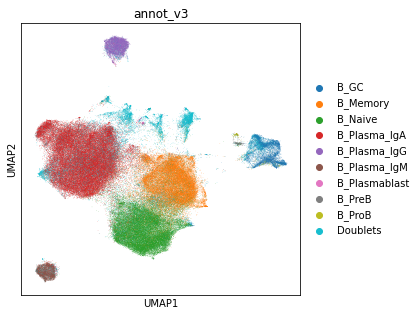

In [8]:
sc.pl.umap(adata,color='annot_v3')

In [9]:
adata.X.max()

36757.0

In [10]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

In [11]:
adata.X.max()

9.205416

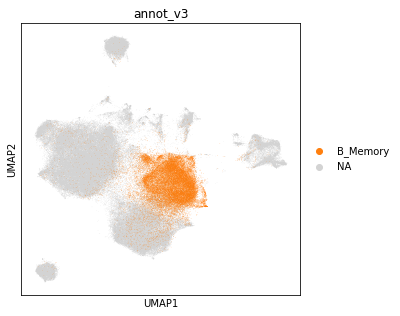

In [12]:
sc.pl.umap(adata,color='annot_v3',groups='B_Memory')

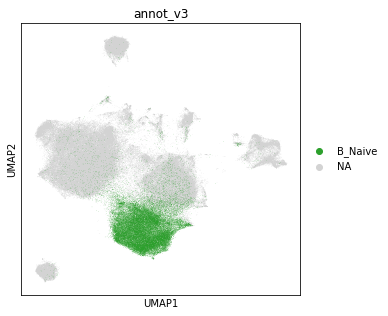

In [13]:
sc.pl.umap(adata,color='annot_v3',groups='B_Naive')

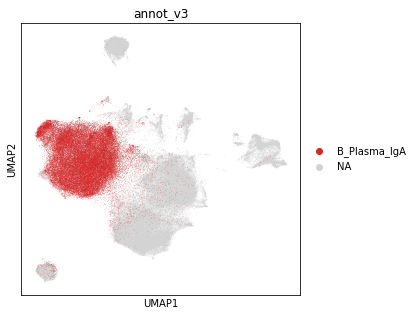

In [14]:
sc.pl.umap(adata,color='annot_v3',groups='B_Plasma_IgA')

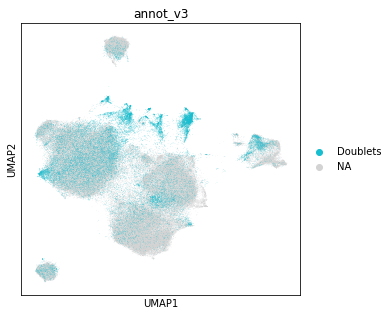

In [15]:
sc.pl.umap(adata,color='annot_v3',groups='Doublets')

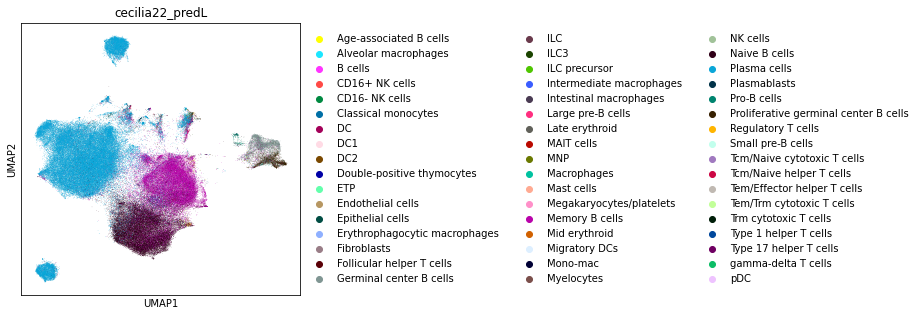

In [16]:
sc.pl.umap(adata,color='cecilia22_predL')

In [17]:
iga = adata[adata.obs.annot_v3.isin(['B_Plasma_IgA'])].copy()

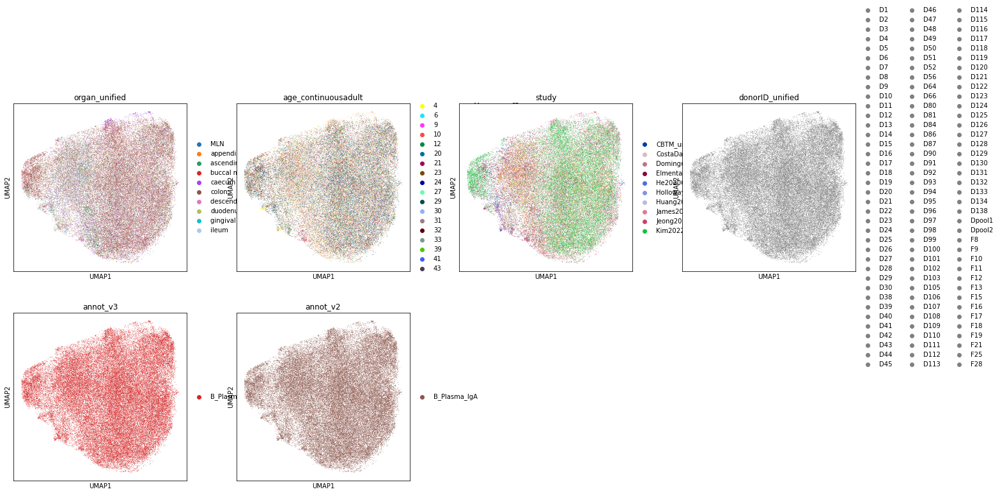

In [18]:
sc.pp.neighbors(
        iga,
            use_rep="X_scvi",
            n_pcs=iga.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(iga, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(iga, color=['organ_unified', 'age_continuousadult','study','donorID_unified','annot_v3','annot_v2'])

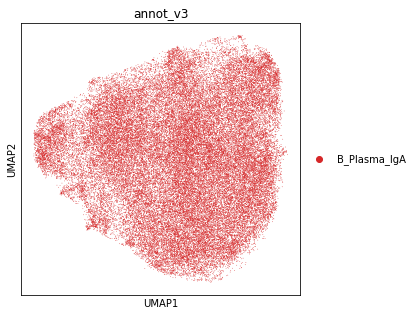

In [19]:
sc.pl.umap(iga,color='annot_v3')

In [20]:
sc.tl.leiden(iga, resolution = 0.2, neighbors_key="neighbors_scvi")

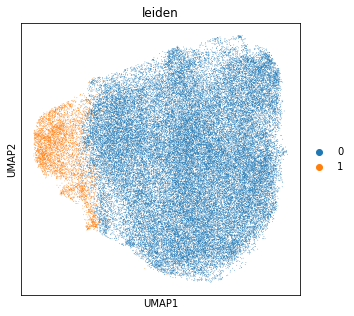

In [21]:
sc.pl.umap(iga,color='leiden')

In [22]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *

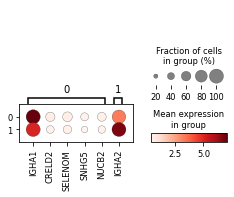

In [23]:
iga.raw = iga.copy()
mkst = calc_marker_stats(iga, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(iga, groupby='leiden', mks=mks)

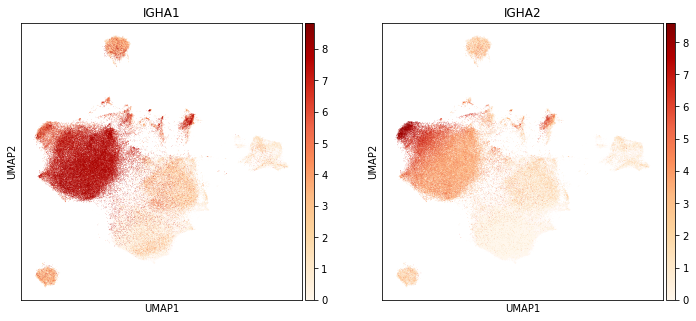

In [24]:
sc.pl.umap(adata,color=['IGHA1','IGHA2'],cmap='OrRd')

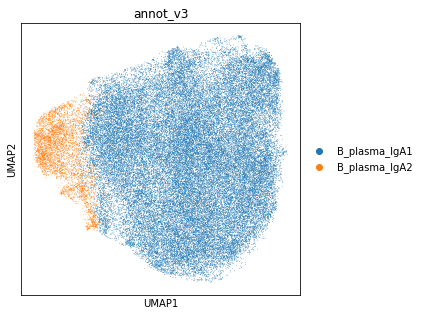

In [25]:
new_cluster_names = [
    'B_plasma_IgA1','B_plasma_IgA2' #0,1

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

iga.obs['annot_v3'] = [conv[x] for x in iga.obs['leiden']]
sc.pl.umap(iga,color='annot_v3')

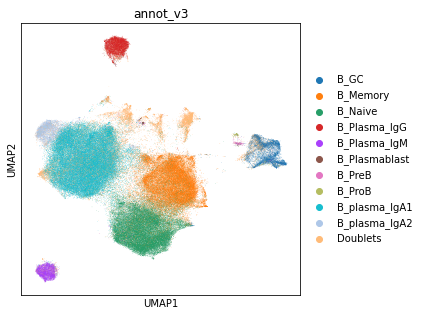

In [26]:
ON = {O:N for O,N in zip(iga.obs_names,iga.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [27]:
gc = adata[adata.obs.annot_v3.isin(['B_GC'])].copy()

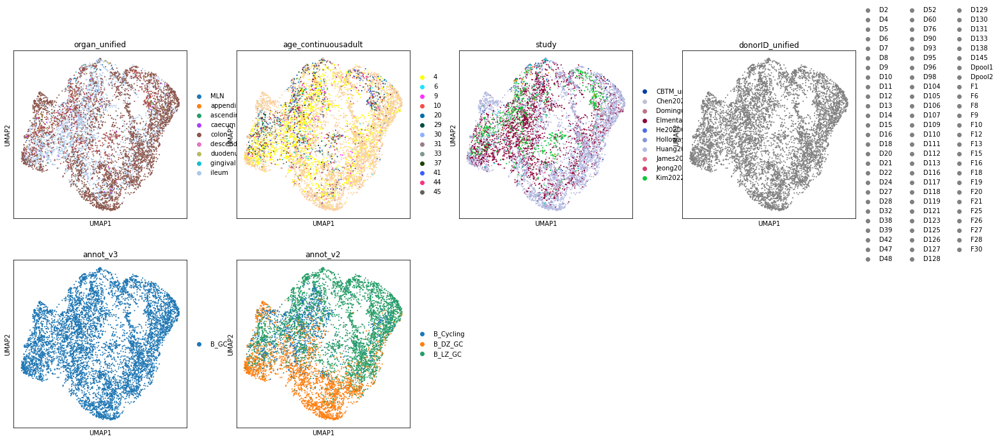

In [28]:
sc.pp.neighbors(
        gc,
            use_rep="X_scvi",
            n_pcs=gc.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(gc, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(gc, color=['organ_unified', 'age_continuousadult','study','donorID_unified','annot_v3','annot_v2'])

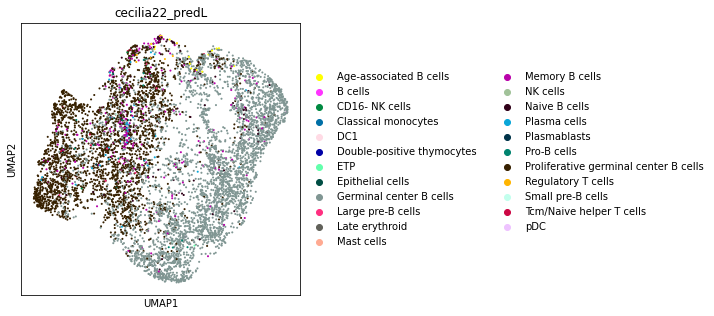

In [29]:
sc.pl.umap(gc,color='cecilia22_predL')

In [30]:
sc.tl.leiden(gc, resolution = 0.2, neighbors_key="neighbors_scvi")

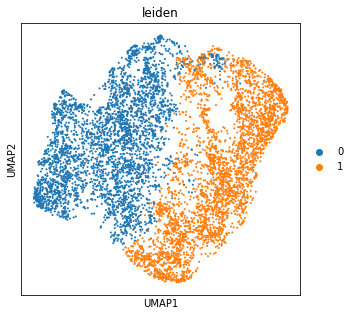

In [31]:
sc.pl.umap(gc,color='leiden')

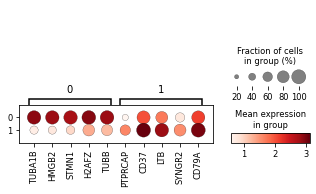

In [32]:
gc.raw = gc.copy()
mkst = calc_marker_stats(gc, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(gc, groupby='leiden', mks=mks)

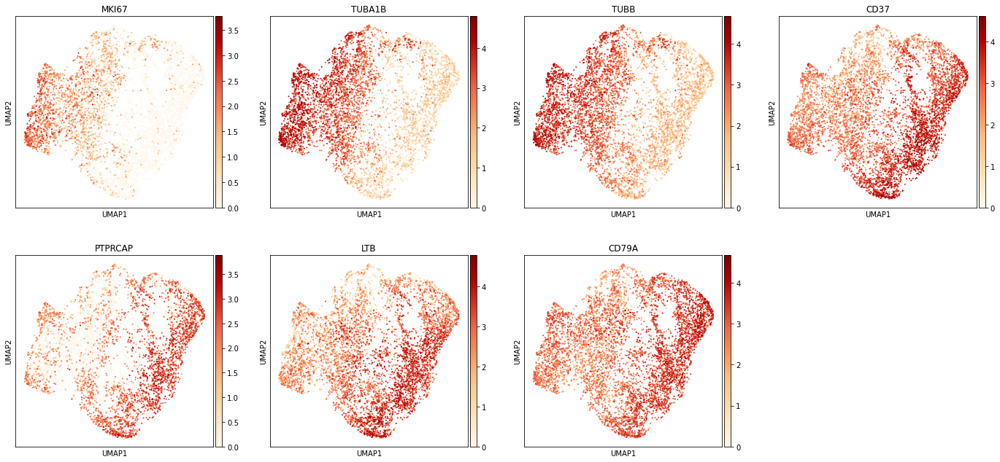

In [33]:
sc.pl.umap(gc,color=['MKI67','TUBA1B','TUBB','CD37','PTPRCAP','LTB','CD79A'],cmap='OrRd')

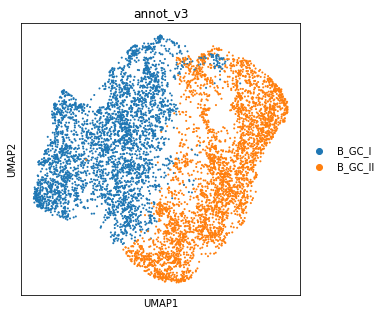

In [34]:
new_cluster_names = [
    'B_GC_I','B_GC_II' #0,1

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

gc.obs['annot_v3'] = [conv[x] for x in gc.obs['leiden']]
sc.pl.umap(gc,color='annot_v3')

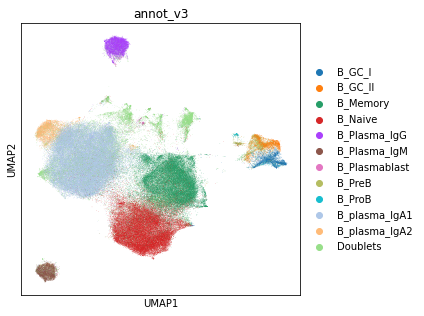

In [35]:
ON = {O:N for O,N in zip(gc.obs_names,gc.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [36]:
mem = adata[adata.obs.annot_v3.isin(['B_Memory'])].copy()

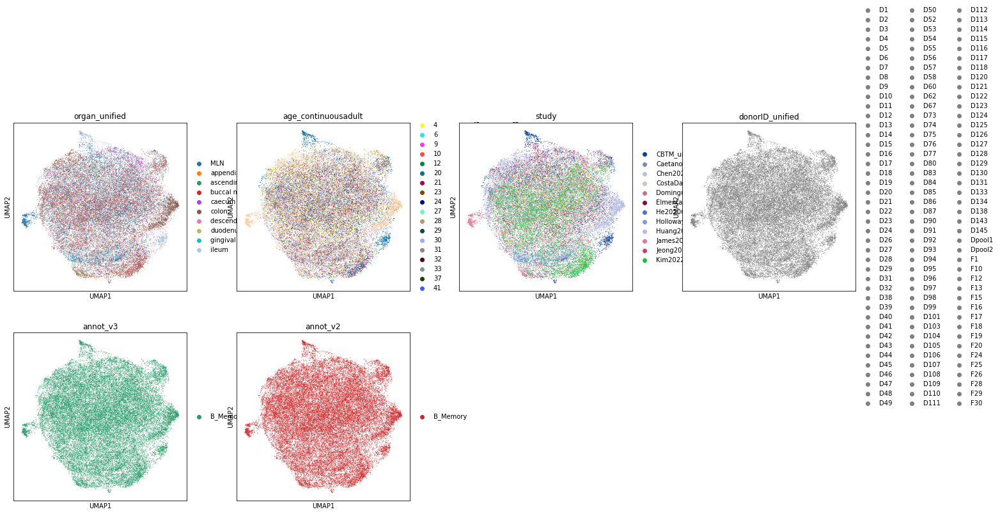

In [37]:
sc.pp.neighbors(
        mem,
            use_rep="X_scvi",
            n_pcs=gc.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(mem, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(mem, color=['organ_unified', 'age_continuousadult','study','donorID_unified','annot_v3','annot_v2'])

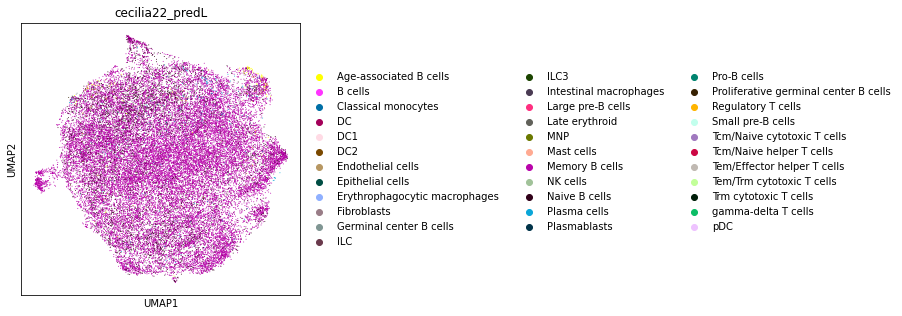

In [38]:
sc.pl.umap(mem,color='cecilia22_predL')

In [39]:
sc.tl.leiden(mem, resolution = 0.2, neighbors_key="neighbors_scvi")

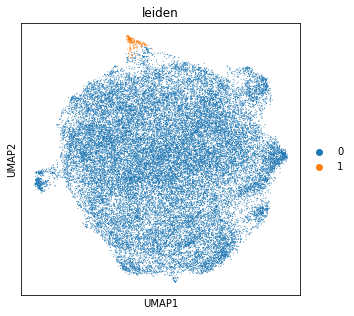

In [40]:
sc.pl.umap(mem,color='leiden')

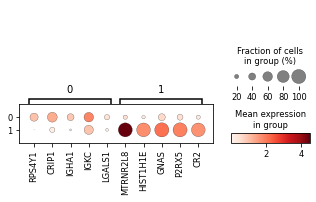

In [41]:
mem.raw = mem.copy()
mkst = calc_marker_stats(mem, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(mem, groupby='leiden', mks=mks)

In [42]:
sc.tl.leiden(mem, resolution = 0.3, neighbors_key="neighbors_scvi")

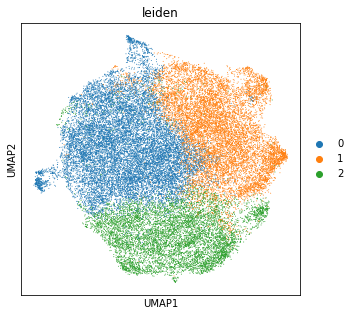

In [43]:
sc.pl.umap(mem,color='leiden')

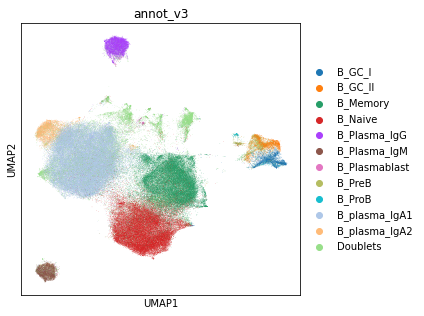

In [44]:
sc.pl.umap(adata,color='annot_v3')

In [45]:
list(adata.obs.annot_v3.unique())

['B_Memory',
 'Doublets',
 'B_Naive',
 'B_PreB',
 'B_ProB',
 'B_Plasmablast',
 'B_Plasma_IgG',
 'B_plasma_IgA1',
 'B_plasma_IgA2',
 'B_GC_I',
 'B_Plasma_IgM',
 'B_GC_II']

In [46]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'B_Memory':'B_memory',
 'B_Naive':'B_naive',
 'B_PreB':'B_preB',
 'B_ProB':'B_proB',
 'B_Plasmablast':'B_plasmablast',
 'B_Plasma_IgG':'B_plasma_IgG',
 'B_Plasma_IgM':'B_plasma_IgM'
    }.get(x, x))
    .astype("category")
)

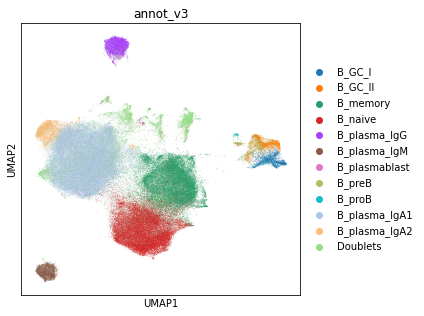

In [47]:
sc.pl.umap(adata,color='annot_v3')

In [48]:
sc.tl.leiden(adata, resolution = 1, neighbors_key="neighbors_scvi")

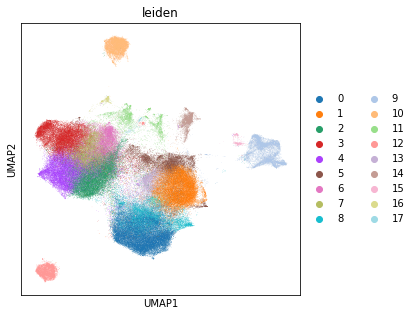

In [49]:
sc.pl.umap(adata,color='leiden')

In [50]:
doub = adata[adata.obs.leiden.isin(['11','14'])].copy()

In [51]:
doub.obs['annot_v3'] = (
    doub.obs["leiden"]
    .map(lambda x: {'11':'Doublets','14':'Doublets'
    }.get(x, x))
    .astype("category")
)

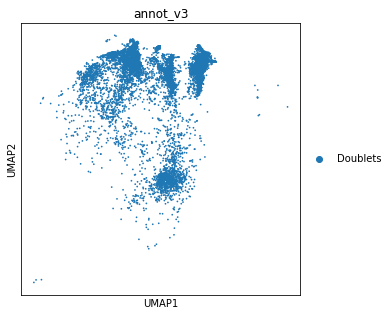

In [52]:
sc.pl.umap(doub,color='annot_v3')

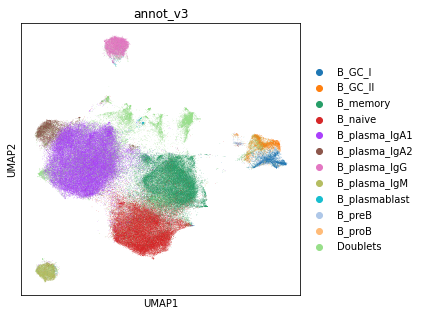

In [53]:
ON = {O:N for O,N in zip(doub.obs_names,doub.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

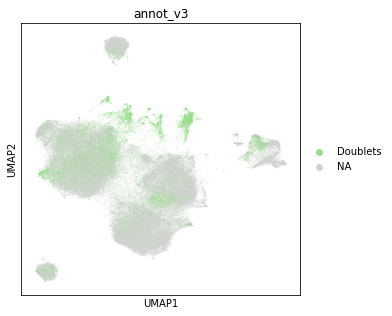

In [54]:
sc.pl.umap(adata,color='annot_v3',groups='Doublets')

In [71]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/B.hvg5000_noCC_noIgVar.scvi_output.annotv3.22021206.h5ad')

In [72]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [73]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/B_annot_v3.csv')

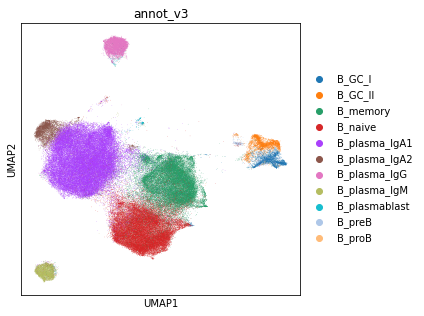

In [55]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [56]:
adata_nodoublets.X.max()

9.180252

In [57]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [58]:
adata_nodoublets.X.max()

36757.0

In [78]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/B.raw.annotv3.nodoublets.22021206.h5ad')

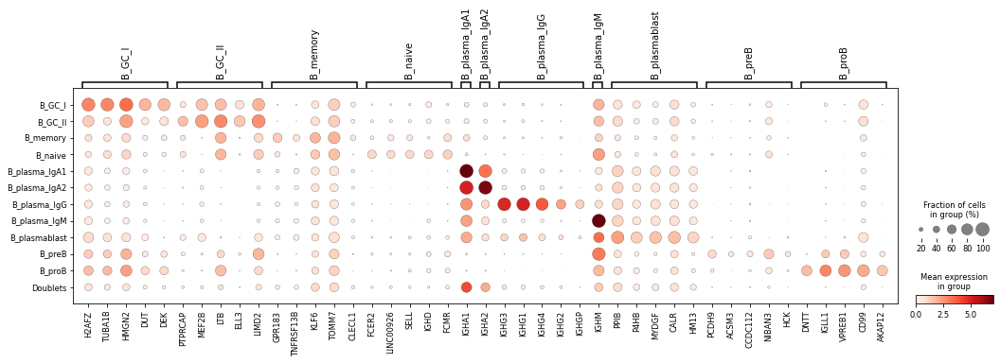

In [80]:
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="annot_v3")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='annot_v3', mks=mks)

## make plots for paper

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [2]:
#make marker gene dotplot
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/no_doublets/B.hvg5000_noCC_noIgVar.scvi_output.annotv3.nodoublets.22021208.h5ad')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


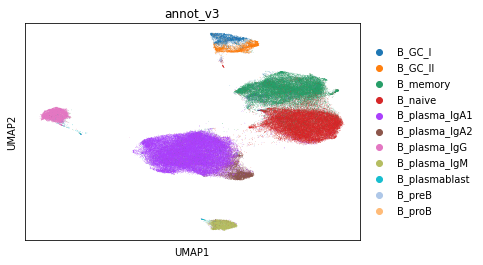

In [3]:
sc.pl.umap(adata,color='annot_v3')

In [5]:
marker_genes_dict = {'General B cell markers':['CD79A','CD79B','CD19','HLA-DRA','HLA-DRB1','MS4A1'],
                     'Germinal centre B cells':['MKI67','AICDA','BCL6','SUGCT'],
                    'Memory B cells':['CD27','TNFRSF13B'],
                     'Naive B cells':['SELL','TCL1A','IGHD'],
                     'General Plasma cell markers':['MZB1','XBP1'],
                     'IgA plasma cells':['IGHA1','IGHA2'],
                     'IgG plasma cells':['IGHG3','IGHG1','IGHG2','IGHG4'],
                     'IgM plasma cells':['IGHM'],
                     'Pre/proB cells':['SPIB','CD37','IGLL1','RAG1','DNTT','VPREB3']}

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


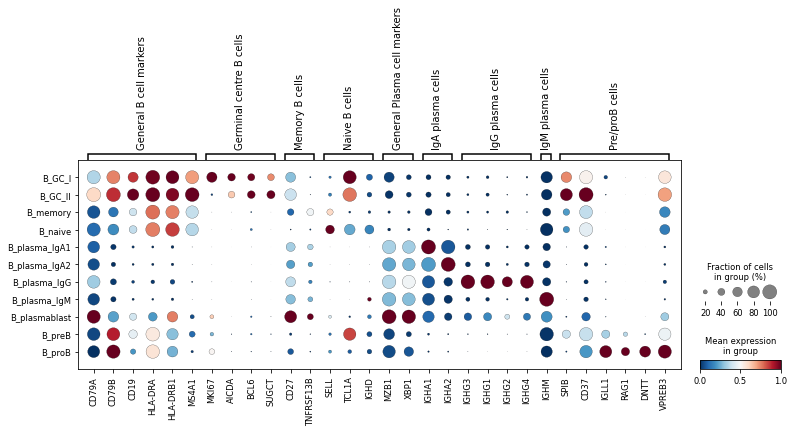

In [6]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='annot_v3',save='B_markers.pdf',color_map='RdBu_r', standard_scale='var')

In [7]:
adata.uns["annot_v3_colors"] = [
    '#db9602', #B_GC_I
'#e2d138', #B_GC_II
'#a33c22',#B_memory
'#9b0319', #B_naive
'#f76c56',#B_plasma_IgA1
'#d6558d',#B_plasma_IgA2
'#632f17',#B_plasma_IgG                            
'#c66d31',#B_plasma_IgM
'#9e53db',#B_plasmablast
'#8a4682',#B_preB
'#d34794']#B_proB

In [8]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.figsize'] = [5,5]
sc.set_figure_params(dpi=300,dpi_save=600)

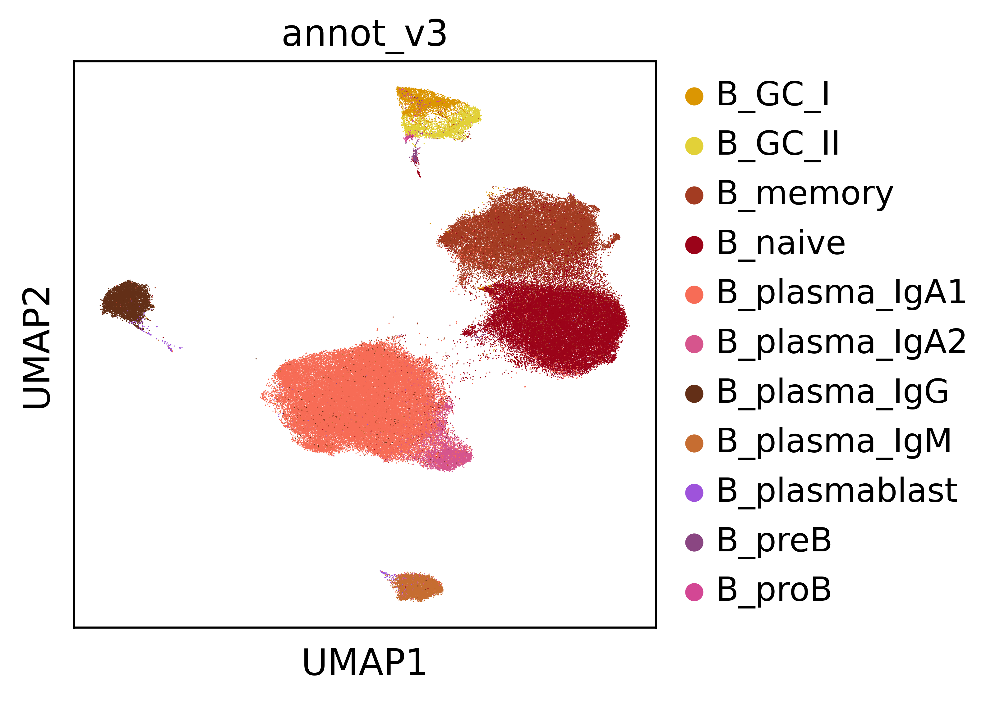

In [9]:
sc.pl.umap(adata,color='annot_v3',save='B_annot.png')

<AxesSubplot: title={'center': 'annot_v3'}, xlabel='UMAP1', ylabel='UMAP2'>

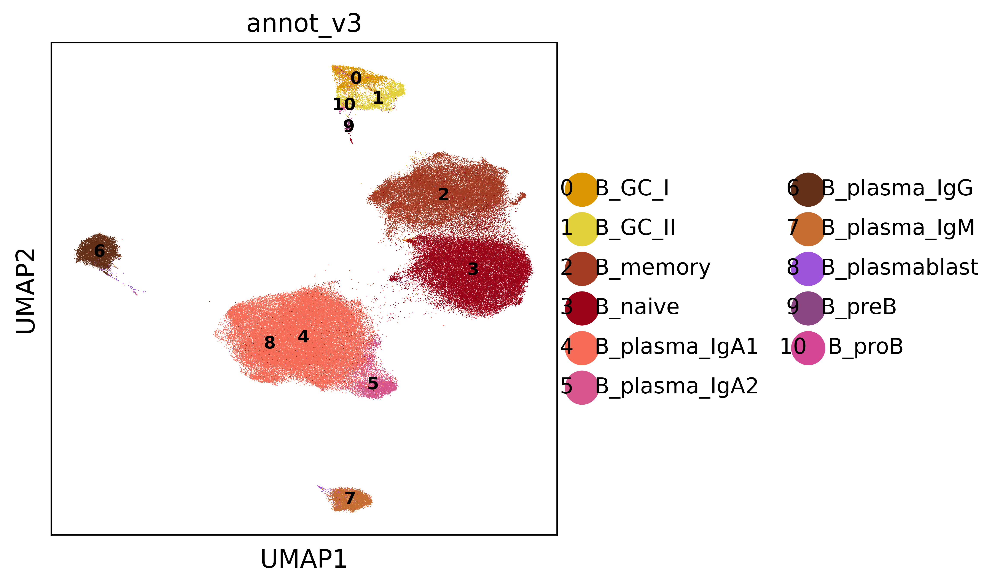

In [10]:
import sctk as sk
sk.plot_embedding(
    adata,
    basis="umap",
    groupby="annot_v3",
    figsize=(5, 5),
    save='figures/B_annot.png')